# Build manifold for Neuronal populations

- Carlos Talavera-López Ph.D | Wellcome Sanger Institute
- v200217

### Import required modules

In [2]:
import scgen
import anndata
import numpy as np
import scanpy as sc
import pandas as pd
import tensorflow as tf

In [3]:
sc.settings.verbosity = 3
sc.logging.print_version_and_date()
sc.settings.set_figure_params(dpi = 260, color_map = 'RdPu', dpi_save = 260, vector_friendly = True, format = 'svg')

Running Scanpy 1.4.4.post1, on 2020-02-17 20:30.


### Fixed function to correct batches.

- This was modified for `scGen` not to jumble the `adata` index and to keep `adata.raw`.
- Once `scGen` updates this in the new version, we can skip it.

In [4]:
import os
from random import shuffle

import anndata
import numpy as np
import scanpy as sc
from matplotlib import pyplot as plt
from scipy import sparse
from sklearn import preprocessing
import pandas as pd

import scgen


def batch_removal_ct5(network, adata, batch_key="batch", cell_label_key="cell_type"):
    """
        Removes batch effect of adata
        # Parameters
        network: `scgen VAE`
            Variational Auto-encoder class object after training the network.
        adata: `~anndata.AnnData`
            Annotated data matrix. adata must have `batch_key` and `cell_label_key` which you pass to the function
             in its obs.
        # Returns
            corrected: `~anndata.AnnData`
                Annotated matrix of corrected data consisting of all cell types whether they have batch effect or not.
        # Example
        ```python
        import scgen
        import anndata
        train = anndata.read("data/pancreas.h5ad")
        train.obs["cell_type"] = train.obs["celltype"].tolist()
        network = scgen.VAEArith(x_dimension=train.shape[1], model_path="./models/batch")
        network.train(train_data=train, n_epochs=20)
        corrected_adata = scgen.batch_removal(network, train)
        ```
     """
    if sparse.issparse(adata.X):
        latent_all = network.to_latent(adata.X.A)
    else:
        latent_all = network.to_latent(adata.X)
    adata_latent = anndata.AnnData(latent_all)
    adata_latent.obs = adata.obs.copy(deep=True)
    unique_cell_types = np.unique(adata_latent.obs[cell_label_key])
    shared_ct = []
    not_shared_ct = []
    for cell_type in unique_cell_types:
        temp_cell = adata_latent[adata_latent.obs[cell_label_key] == cell_type]
        if len(np.unique(temp_cell.obs[batch_key])) < 2:
            cell_type_ann = adata_latent[adata_latent.obs[cell_label_key] == cell_type]
            not_shared_ct.append(cell_type_ann)
            continue
        temp_cell = adata_latent[adata_latent.obs[cell_label_key] == cell_type]
        batch_list = {}
        batch_ind = {}
        max_batch = 0
        max_batch_ind = ""
        batches = np.unique(temp_cell.obs[batch_key])
        for i in batches:
            temp = temp_cell[temp_cell.obs[batch_key] == i]
            temp_ind = temp_cell.obs[batch_key] == i
            if max_batch < len(temp):
                max_batch = len(temp)
                max_batch_ind = i
            batch_list[i] = temp
            batch_ind[i] = temp_ind
        max_batch_ann = batch_list[max_batch_ind]
        for study in batch_list:
            delta = np.average(max_batch_ann.X, axis=0) - np.average(batch_list[study].X, axis=0)
            batch_list[study].X = delta + batch_list[study].X
            temp_cell[batch_ind[study]].X = batch_list[study].X
        shared_ct.append(temp_cell)
    all_shared_ann = anndata.AnnData.concatenate(*shared_ct, batch_key="concat_batch", index_unique=None)
    if "concat_batch" in all_shared_ann.obs.columns:
        del all_shared_ann.obs["concat_batch"]
    if len(not_shared_ct) < 1:
        corrected = anndata.AnnData(network.reconstruct(all_shared_ann.X, use_data=True))
        corrected.obs = all_shared_ann.obs.copy(deep=True)
        corrected.var_names = adata.var_names.tolist()
        corrected = corrected[adata.obs_names]
        if adata.raw is not None:
            adata_raw = anndata.AnnData(X=adata.raw.X, var=adata.raw.var)
            adata_raw.obs_names = adata.obs_names
            corrected.raw = adata_raw
        return corrected
    else:
        all_not_shared_ann = anndata.AnnData.concatenate(*not_shared_ct, batch_key="concat_batch", index_unique=None)
        all_corrected_data = anndata.AnnData.concatenate(all_shared_ann, all_not_shared_ann, batch_key="concat_batch",  index_unique=None)
        if "concat_batch" in all_shared_ann.obs.columns:
            del all_corrected_data.obs["concat_batch"]
        corrected = anndata.AnnData(network.reconstruct(all_corrected_data.X, use_data=True), )
        corrected.obs = pd.concat([all_shared_ann.obs, all_not_shared_ann.obs])
        corrected.var_names = adata.var_names.tolist()
        corrected = corrected[adata.obs_names]
        if adata.raw is not None:
            adata_raw = anndata.AnnData(X=adata.raw.X, var=adata.raw.var)
            adata_raw.obs_names = adata.obs_names
            corrected.raw = adata_raw
        return corrected

### Read in sources

In [5]:
neuronal_cells = sc.read_h5ad('/home/jovyan/experiments/2-subpopulation_manifolds/neuronal/1-source_annotation/heart_neuronal_cells_annotated_ctl200217.h5ad')
neuronal_cd45 = sc.read_h5ad('/home/jovyan/experiments/2-subpopulation_manifolds/neuronal/1-source_annotation/heart_neuronal_cd45_annotated_ctl200217.h5ad')
neuronal_sanger = sc.read_h5ad('/home/jovyan/experiments/2-subpopulation_manifolds/neuronal/1-source_annotation/heart_sanger_neuronal_nuclei_annotated_ctl200217.h5ad')
neuronal_harvard = sc.read_h5ad('/home/jovyan/experiments/2-subpopulation_manifolds/neuronal/1-source_annotation/heart_harvard_neuronal_nuclei_annotated_ctl200217.h5ad')

### Change labels for each source

In [6]:
neuronal_cells.obs['cell_states'].cat.categories

Index(['CD9+N0', 'Str1'], dtype='object')

In [7]:
trans_from=[['CD9+N0'],['Str1']]
trans_to = ['CD9_Neuronal', 'Stromal-like']

neuronal_cells.obs['cell_type'] = [str(i) for i in neuronal_cells.obs['cell_states']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        neuronal_cells.obs['cell_type'][neuronal_cells.obs['cell_type'] == leiden_from] = celltype

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [8]:
neuronal_cd45.obs['cell_states'].cat.categories

Index(['CD9+N0', 'Str1'], dtype='object')

In [9]:
trans_from=[['CD9+N0'],['Str1']]
trans_to = ['CD9_Neuronal', 'Stromal-like']

neuronal_cd45.obs['cell_type'] = [str(i) for i in neuronal_cd45.obs['cell_states']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        neuronal_cd45.obs['cell_type'][neuronal_cd45.obs['cell_type'] == leiden_from] = celltype

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [10]:
neuronal_sanger.obs['cell_states'].cat.categories

Index(['NRXN1_N0', 'CD9+N1', 'Str2', 'doublets_N3', 'N4'], dtype='object')

In [13]:
trans_from=[['NRXN1_N0'],['CD9+N1'],['Str2'],['doublets_N3'],['N4']]
trans_to = ['NRXN_Neuronal', 'CD9_Neuronal', 'Stromal-like', 'doublets', 'basic']

neuronal_sanger.obs['cell_type'] = [str(i) for i in neuronal_sanger.obs['cell_states']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        neuronal_sanger.obs['cell_type'][neuronal_sanger.obs['cell_type'] == leiden_from] = celltype

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [12]:
neuronal_harvard.obs['cell_states'].cat.categories

Index(['CD9+N0', 'NRXN1_N1', 'Str2', 'doublets_N3', 'NRXN4_N4', 'Str5', 'Str6',
       'N7'],
      dtype='object')

In [14]:
trans_from=[['NRXN1_N1','NRXN4_N4'],['CD9+N0'],['Str2','Str5','Str6'],['doublets_N3'],['N7']]
trans_to = ['NRXN_Neuronal', 'CD9_Neuronal', 'Stromal-like', 'doublets', 'basic']

neuronal_harvard.obs['cell_type'] = [str(i) for i in neuronal_harvard.obs['cell_states']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        neuronal_harvard.obs['cell_type'][neuronal_harvard.obs['cell_type'] == leiden_from] = celltype

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


### Merge object

In [65]:
heart_neuronal = neuronal_harvard.concatenate(neuronal_sanger, neuronal_cells, neuronal_cd45, batch_key = 'cell_source', batch_categories = ['Harvard-Nuclei', 'Sanger-Nuclei', 'Sanger-Cells', 'Sanger-CD45'], join = 'outer')
heart_neuronal.shape

(4840, 33538)

In [66]:
pd.crosstab(heart_neuronal.obs['cell_source'], heart_neuronal.obs['cell_type'])

cell_type,CD9_Neuronal,NRXN_Neuronal,Stromal-like,basic,doublets
cell_source,,,,,
Harvard-Nuclei,1240,684,536,24,123
Sanger-Nuclei,507,1053,79,31,39
Sanger-Cells,225,0,13,0,0
Sanger-CD45,229,0,57,0,0


In [67]:
heart_neuronal.obs['cell_type'] = heart_neuronal.obs['cell_type'].astype('category')
heart_neuronal.obs['cell_type'].cat.categories

Index(['CD9_Neuronal', 'NRXN_Neuronal', 'Stromal-like', 'basic', 'doublets'], dtype='object')

### Remove immune-like stromal cells 

In [68]:
heart_neuronal = heart_neuronal[~heart_neuronal.obs['cell_type'].isin(['doublets'])]
heart_neuronal.shape

(4678, 33538)

### Normalise and scale dataset

In [69]:
neuronal_raw = heart_neuronal.copy()
sc.pp.normalize_per_cell(heart_neuronal)
sc.pp.log1p(heart_neuronal)
heart_neuronal.raw = heart_neuronal.copy()

normalizing by total count per cell


Trying to set attribute `.obs` of view, making a copy.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [70]:
sc.pp.highly_variable_genes(heart_neuronal, flavor = 'seurat', n_top_genes = 10000)
neuronal_hvg = heart_neuronal[:, heart_neuronal.var['highly_variable']]
sc.pp.scale(neuronal_hvg, max_value = 10)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


### Run scGEN on _source_

- Prepare the object

In [71]:
hvg_scGen_batch_1 = heart_neuronal.copy()
hvg_scGen_batch_1.obs["batch"] = heart_neuronal.obs["cell_source"].tolist()
hvg_scGen_batch_1.obs["cell_type"] = heart_neuronal.obs["cell_type"].tolist()

- Prepare scGEN object

In [72]:
tf.reset_default_graph()
network_batch_1 = scgen.VAEArith(x_dimension = hvg_scGen_batch_1.shape[1], model_path = "/home/jovyan/experiments/2-subpopulation_manifolds/neuronal/")

- Train the model

In [73]:
network_batch_1.train(train_data = hvg_scGen_batch_1, n_epochs = 10)

- Correct batches

In [74]:
corrected_batch_1 = batch_removal_ct5(network_batch_1, hvg_scGen_batch_1)

Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


- Visualise

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:08)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


... storing 'NRP' as categorical
... storing 'age_group' as categorical
... storing 'batch' as categorical
... storing 'cell_source' as categorical
... storing 'cell_states' as categorical
... storing 'cell_type' as categorical
... storing 'donor' as categorical
... storing 'leiden' as categorical
... storing 'leiden_annotated' as categorical
... storing 'sample' as categorical
... storing 'source' as categorical
... storing 'type' as categorical
... storing 'version' as categorical


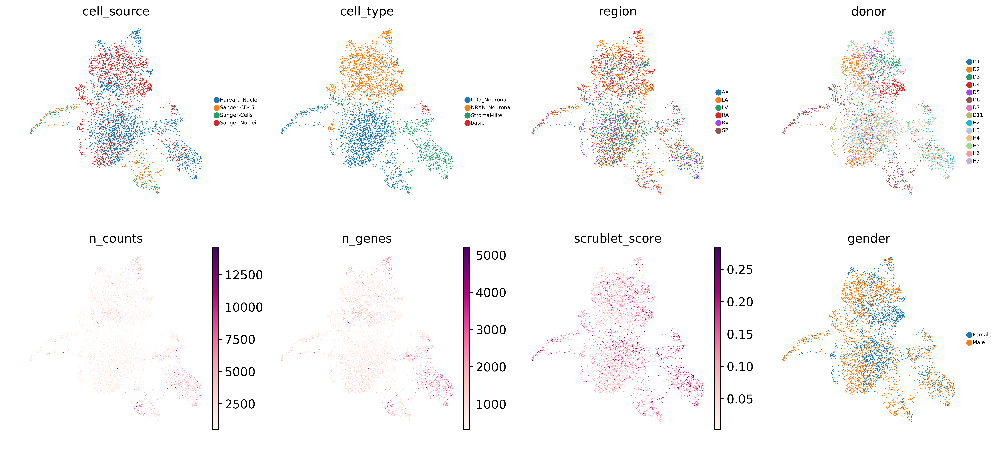

In [75]:
sc.pp.neighbors(corrected_batch_1, random_state = 1786)
sc.tl.umap(corrected_batch_1, min_dist = 0.4, spread = 1, random_state = 1786)
sc.pl.umap(corrected_batch_1, color = ['cell_source','cell_type','region','donor','n_counts','n_genes','scrublet_score','gender'], size = 4, legend_fontsize = 6, color_map = 'RdPu', frameon = False)

### Correct for donor

In [76]:
hvg_scGen_batch_2 = corrected_batch_1.copy()
hvg_scGen_batch_2.obs["batch"] = corrected_batch_1.obs["donor"].tolist()
hvg_scGen_batch_2.obs["cell_type"] = corrected_batch_1.obs["cell_type"].tolist()

- Create scGen model

In [77]:
tf.reset_default_graph()
network_batch_2 = scgen.VAEArith(x_dimension = hvg_scGen_batch_2.shape[1], model_path = "/home/jovyan/experiments/2-subpopulation_manifolds/neuronal/")

In [78]:
network_batch_2.train(train_data = hvg_scGen_batch_2, n_epochs = 10)

In [79]:
corrected_batch_2 = batch_removal_ct5(network_batch_2, hvg_scGen_batch_2)

Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.
/opt/conda/lib/python3.7/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:06)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


... storing 'batch' as categorical
... storing 'cell_source' as categorical
... storing 'cell_states' as categorical
... storing 'cell_type' as categorical
... storing 'donor' as categorical
... storing 'leiden' as categorical
... storing 'leiden_annotated' as categorical
... storing 'sample' as categorical
... storing 'source' as categorical


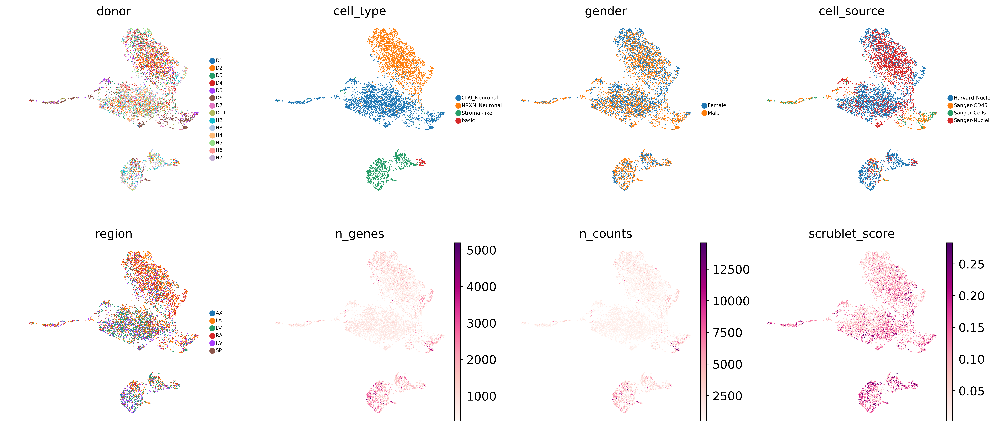

In [80]:
sc.pp.neighbors(corrected_batch_2, random_state = 1786)
sc.tl.umap(corrected_batch_2, min_dist = 0.4, spread = 2, random_state = 1786)
sc.pl.umap(corrected_batch_2, color = ['donor',  'cell_type', 'gender', 'cell_source', 'region', 'n_genes', 'n_counts', 'scrublet_score'], size = 6, legend_fontsize = 6, color_map = 'RdPu', frameon = False)

### Call markers on Leiden

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


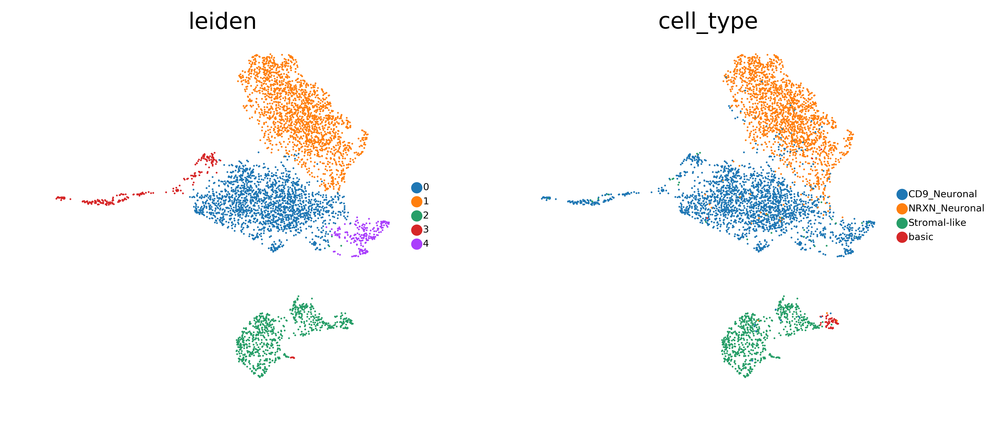

In [84]:
sc.tl.leiden(corrected_batch_2, resolution = 0.3, random_state = 1712)
sc.pl.umap(corrected_batch_2, color = ['leiden', 'cell_type'], size = 5, legend_fontsize = 6, color_map = 'RdPu', use_raw = True, frameon = False)

### Call markers

In [85]:
sc.tl.rank_genes_groups(corrected_batch_2, 'leiden', method = 'wilcoxon', n_genes = 500, use_raw = True)
result = corrected_batch_2.uns['rank_genes_groups']
groups = result['names'].dtype.names
markers_immune = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
markers_immune.head(10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,3_p,3_l,4_n,4_p,4_l
0,RYR2,1.262629e-30,1.302791,ADGRB3,5.505614e-110,1.215538,PRKG1,2.885278e-162,3.350429,MT-ND4,3.146695e-73,3.166091,RPL41,1.789537e-100,3.976607
1,MYL2,8.582381e-20,1.652865,NRXN1,3.908905e-98,1.004367,EBF1,2.306239e-139,3.432560,MT-CO2,2.350631e-68,2.991622,FTH1,1.789537e-100,4.357388
2,TTN,4.154751e-19,1.136161,NRXN3,2.270317e-72,0.886016,PLA2G5,3.446338e-119,4.497006,FTH1,2.641143e-67,2.940135,S100A6,8.285808e-100,3.830872
3,ANK3,3.597655e-14,0.452688,XKR4,1.008552e-71,1.026389,PTPRG,4.686640e-116,2.212924,MT-ND2,2.641143e-67,3.300596,RPL7,1.238228e-95,4.459861
4,PDE4DIP,9.747393e-14,0.651584,CADM2,2.163125e-69,0.916757,LHFPL6,9.163991e-116,3.178402,B2M,3.535643e-62,2.885248,RPL34,1.299971e-95,4.334640
5,NRXN3,5.373321e-13,0.383998,IL1RAPL1,2.307612e-57,0.990007,RORA,1.264943e-107,2.451484,MT-CO1,2.553773e-60,2.575003,RPS14,2.282341e-93,4.049473
6,NEGR1,1.441040e-09,0.414908,NPPA,6.021393e-53,2.372351,LAMA2,8.485210e-99,2.061249,MT-CO3,1.935153e-58,2.622485,LGALS1,1.304790e-92,3.822402
7,LPP,1.474116e-09,0.512117,SORCS1,3.648259e-50,0.933185,AC007319.1,1.138239e-98,3.691924,MT-ATP6,3.109414e-56,2.955315,RPL32,2.090309e-92,4.116632
8,CDH19,2.067807e-09,0.280993,AC016766.1,1.776656e-48,1.324395,DCN,2.317200e-94,2.712976,CALM2,2.828896e-55,3.833237,FTL,6.821896e-92,3.900787
9,NCAM1,4.863792e-09,0.509237,EHBP1,3.843470e-40,0.701564,ARHGAP10,8.628505e-93,3.408494,S100A6,7.838287e-55,2.593125,MT-ND2,1.404569e-91,3.940459


### Save annotated objects

In [86]:
heart_neuronal_raw = anndata.AnnData(X = neuronal_raw.X , obs = corrected_batch_2.obs, var = neuronal_raw.var, obsm = corrected_batch_2.obsm)
heart_neuronal_raw.raw = neuronal_raw.copy()
heart_neuronal_raw.write('/home/jovyan/experiments/2-subpopulation_manifolds/neuronal/2-aligned_batches/heart_neuronal_scGen_global_ctl200217.h5ad')

... storing 'feature_types-Harvard-Nuclei-Harvard-Nuclei' as categorical
... storing 'feature_types-Sanger-Nuclei-Harvard-Nuclei' as categorical
... storing 'feature_types-Sanger-Cells-Harvard-Nuclei' as categorical
... storing 'feature_types-Sanger-CD45-Harvard-Nuclei' as categorical
... storing 'feature_types-Harvard-Nuclei-Sanger-Nuclei' as categorical
... storing 'feature_types-Sanger-Nuclei-Sanger-Nuclei' as categorical
... storing 'feature_types-Sanger-Cells-Sanger-Nuclei' as categorical
... storing 'feature_types-Sanger-CD45-Sanger-Nuclei' as categorical
... storing 'feature_types-Harvard-Nuclei-Sanger-Cells' as categorical
... storing 'feature_types-Sanger-Nuclei-Sanger-Cells' as categorical
... storing 'feature_types-Sanger-Cells-Sanger-Cells' as categorical
... storing 'feature_types-Sanger-CD45-Sanger-Cells' as categorical
... storing 'feature_types-Harvard-Nuclei-Sanger-CD45' as categorical
... storing 'feature_types-Sanger-Nuclei-Sanger-CD45' as categorical
... storing 'fe

- Website